In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
import seaborn as sns
from scipy.ndimage import center_of_mass
import pandas as pd

from pathlib import Path
import random
import math
from copy import deepcopy
import shutil
from collections import defaultdict
from tqdm.notebook import tqdm

from src.visualise.plot import plot_data, plot_data_simple
from src.data.paths import project_dir
from src.data.analysis import Circle, create_circular_mask, read_tiff_img
from src.data.detector import find_circle_hough_method, img_for_circle_detection, DetectorDataCollection, DetectorData, DetectorImage

In [2]:
def center_of_mass_det(data: DetectorData) -> tuple[float, float]:
    detector_region = deepcopy(data.raw.image)
    circle_smaller_than_det = Circle(x=data.circle.x, y=data.circle.y, r=data.circle.r * 0.95)
    mask_circle = create_circular_mask(img=detector_region, circle_px=circle_smaller_than_det)
    detector_region[~mask_circle] = 0
    cm = center_of_mass(detector_region)
    return cm

# Data structures

In [3]:
# local paths
base_path = project_dir / 'data' / 'raw'
# raw_path = base_path / '2024-09-18'
# bg_path = base_path / '2024-09-16'

# # onedrive paths
# base_path = Path.home() / 'OneDrive - ifj.edu.pl' / 'Projects' / 'MB_foils'
# raw_path = base_path / '2024-09-18'
# bg_path = base_path / '2024-09-16'
base_path.exists()

True

In [4]:
proton_path = base_path / '2025-03-27' / 'PB'
proton_raw_data = DetectorDataCollection(path=proton_path)

10 11 12 13 14 15 16 17 18 19 1 20 21 22 23 24 25 26 27 28 29 2 30 31 32 33 34 35 36 37 38 39 3 40 4 5 6 7 8 9 

In [5]:
co60_path = base_path / '2025-03-18'
co60_raw_data = DetectorDataCollection(path=co60_path)

85 86 87 88 89 

In [6]:
bg_path = base_path / '2025-03-27' / 'tlo2'
bg_path.exists()

True

In [7]:
bg_raw_det_path = next(bg_path.glob('**/*tif'))
bg_raw_det_image = DetectorImage(path=bg_raw_det_path, image=read_tiff_img(bg_raw_det_path, border_px=0))
bg_lv_det_path = next(bg_path.with_name(bg_path.name + '_lv').glob('**/*tif'))
bg_lv_det_image = DetectorImage(path=bg_lv_det_path, image=read_tiff_img(bg_lv_det_path, border_px=0))
bg_det_data = DetectorData(raw=bg_raw_det_image, lv=bg_lv_det_image, det_no=-1)

bg_raw_data = DetectorDataCollection(path=bg_path, data={-1: bg_det_data})

## Output paths

In [8]:
base_output_path = project_dir / 'data' / 'interim' / '2025-03-27' / 'PB'  # local 
#base_output_path =  Path.home() / 'OneDrive - ifj.edu.pl' / 'Projects' / 'MB_foils' / 'publication_Measurement_2024' / 'analysis' / 'interim' / '2024-11-21'  # OneDrive

proton_output_path = base_output_path / 'protons'
co60_output_path = base_output_path / 'Co60'
bg_output_path = base_output_path / 'background'

# remove base output path
shutil.rmtree(base_output_path, ignore_errors=True)

# create output paths
proton_output_path.mkdir(parents=True, exist_ok=True)
co60_output_path.mkdir(parents=True, exist_ok=True)
bg_output_path.mkdir(parents=True, exist_ok=True)

print(f"created {proton_output_path}")

created /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons


# Proton raw data

In [9]:
proton_det_id = list(proton_raw_data.data.keys())[0]
proton_det_id

10

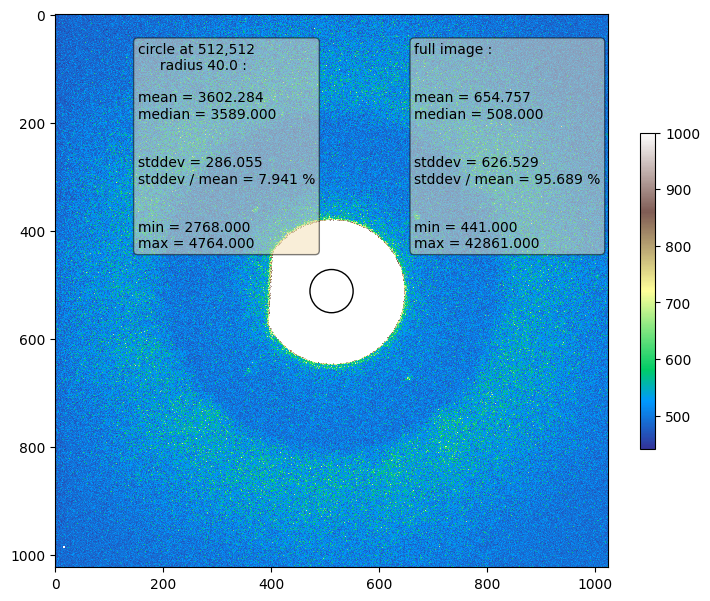

In [10]:
fig, ax = plot_data_simple(proton_raw_data.data[proton_det_id].raw.image, circle_px=proton_raw_data.data[proton_det_id].lv.init_circle, vmax=1000, figsize=(7, 8))

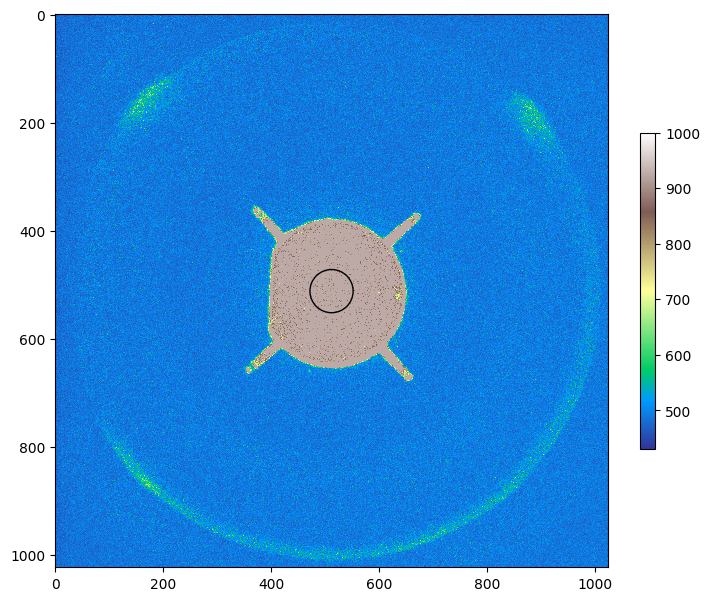

In [11]:
fig, ax = plot_data_simple(
    proton_raw_data.data[proton_det_id].lv.image, 
    circle_px=proton_raw_data.data[proton_det_id].lv.init_circle, 
    describe=False,
    path='file.png',
    vmax=1000, figsize=(7, 8))

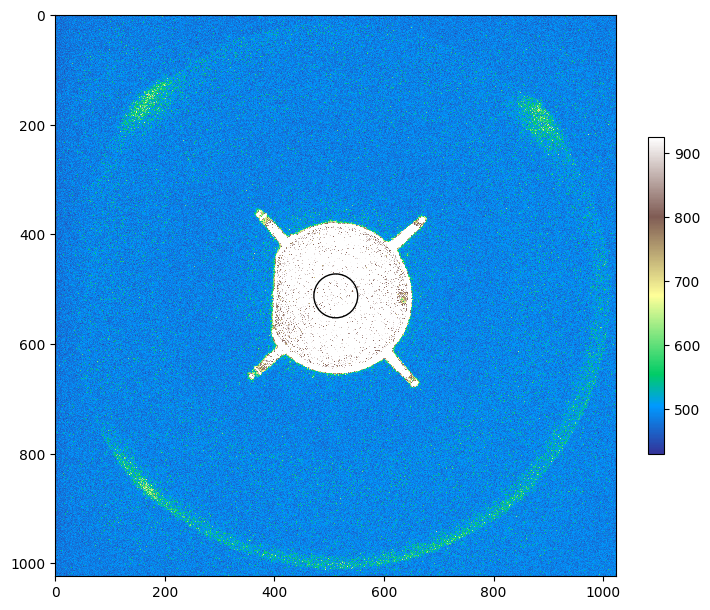

In [12]:
fig, ax = plot_data_simple(
    proton_raw_data.data[proton_det_id].lv.image, 
    circle_px=proton_raw_data.data[proton_det_id].lv.init_circle, 
    describe=False,
    path='file.png',
    # vmin=2000,
    # vmax=5000, 
    figsize=(7, 8))

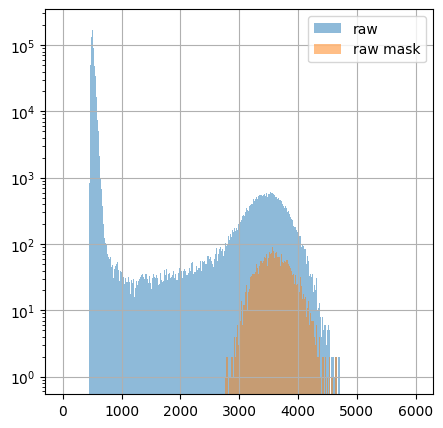

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
bins = np.arange(0, 6000, 10)
mask = create_circular_mask(proton_raw_data.data[proton_det_id].raw.image, proton_raw_data.data[proton_det_id].raw.init_circle)
ax.hist(proton_raw_data.data[proton_det_id].raw.image.flatten(), bins=bins, alpha=0.5, label='raw');
ax.hist(proton_raw_data.data[proton_det_id].raw.image[mask].flatten(), bins=bins, alpha=0.5, label='raw mask');
ax.set_yscale('log')
ax.grid()
ax.legend();

# Co60 raw data

In [14]:
co60_det_id = list(co60_raw_data.data.keys())[0]
co60_det_id

85

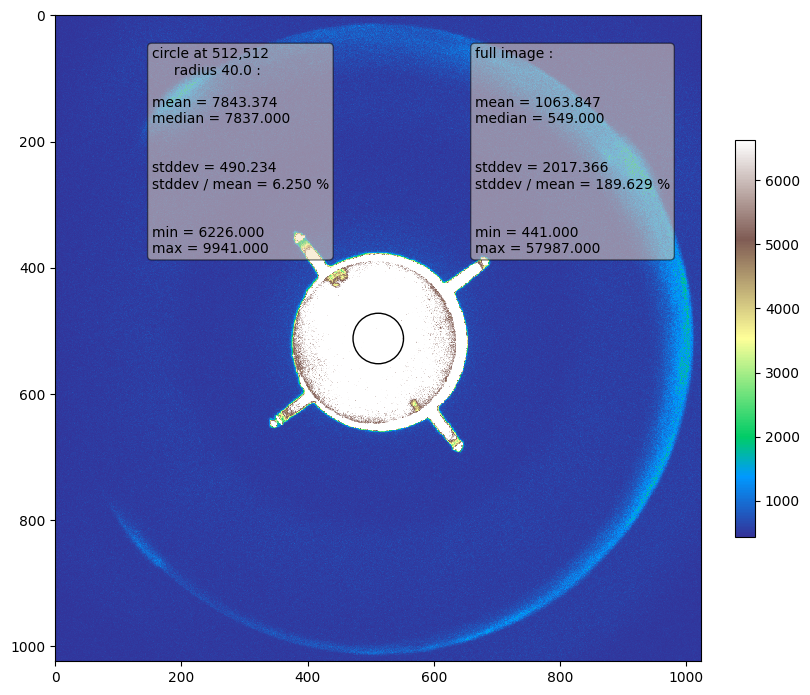

In [15]:
fig, ax = plot_data(co60_raw_data.data[co60_det_id].lv.image, circle_px=co60_raw_data.data[co60_det_id].lv.init_circle)

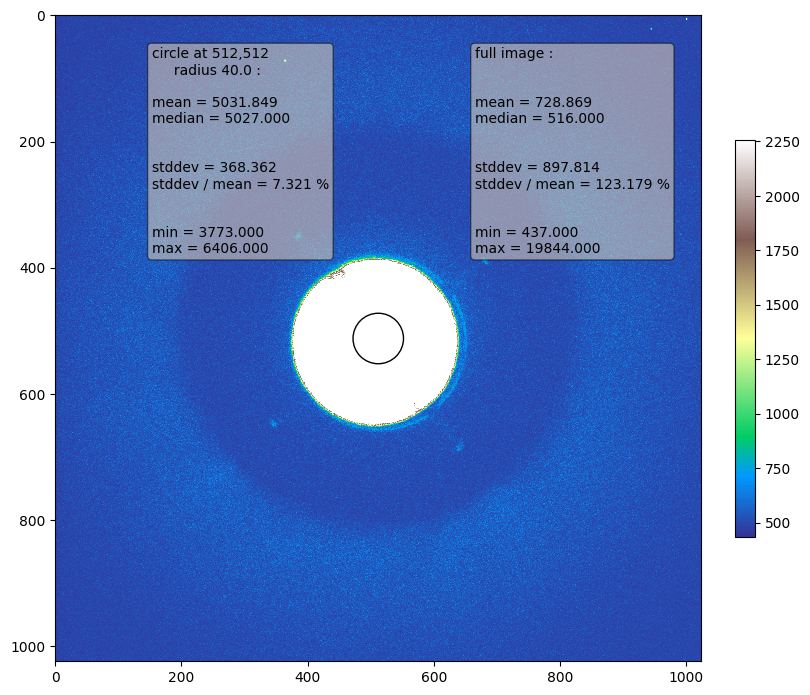

In [16]:
fig, ax = plot_data_simple(co60_raw_data.data[co60_det_id].raw.image, circle_px=co60_raw_data.data[co60_det_id].raw.init_circle)

## Background

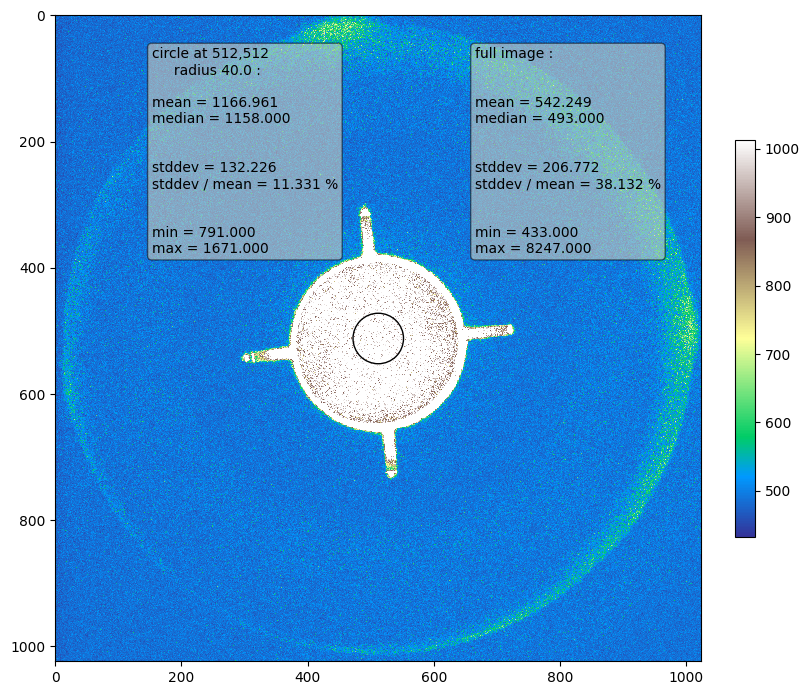

In [17]:
fig, ax = plot_data(bg_det_data.lv.image, circle_px=bg_det_data.lv.init_circle)

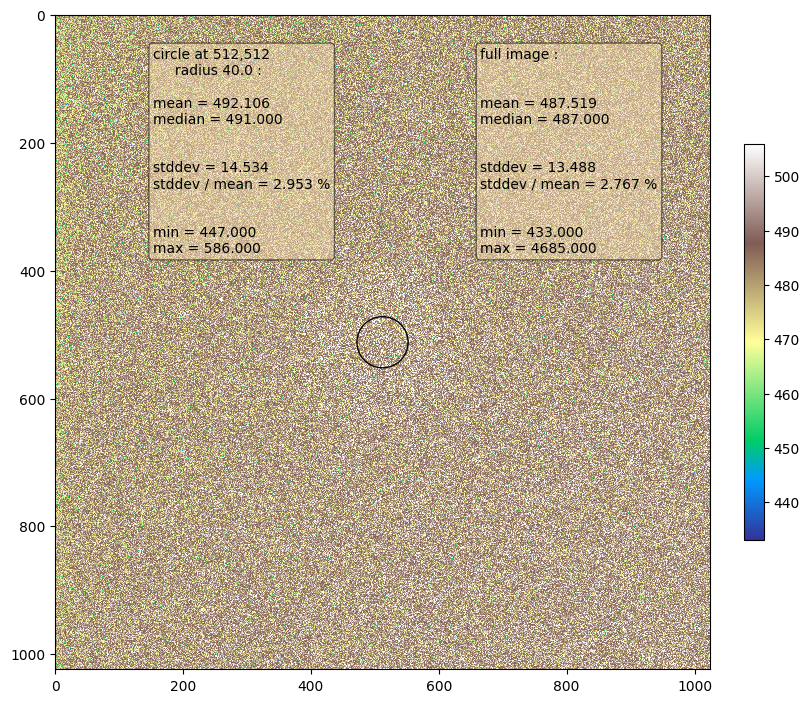

In [18]:
fig, ax = plot_data(bg_det_data.raw.image, circle_px=bg_det_data.raw.init_circle)

# Save plots

## Save LV without detector

In [19]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path, bg_output_path],
    [proton_raw_data, co60_raw_data, bg_raw_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'live_view'
    plot_path.mkdir(parents=True, exist_ok=True)

    # set vmin to the 5% centile of all images and vmax to 95% centile
    concatenated_flattened_lv_data = np.concatenate([data.lv.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_lv_data, q=5)
    vmax = np.nanpercentile(a=concatenated_flattened_lv_data, q=95)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'lv_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        #print(f"Saving detector {det_no} / {len(dataset.data)} into {output_path}")
        fig, ax = plot_data_simple(data.lv.image, circle_px=data.lv.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 472.0, vmax: 964.0
vmin: 473.0, vmax: 1083.0
vmin: 471.0, vmax: 1013.0


## Save raw data without detector

In [20]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path, bg_output_path],
    [proton_raw_data, co60_raw_data, bg_raw_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'raw_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'raw_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.raw.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 474.0, vmax: 11495.6
vmin: 476.0, vmax: 5556.6
vmin: 467.0, vmax: 509.0


# Background subtraction

In [21]:
proton_bg_sub_data = DetectorDataCollection(path=proton_raw_data.path, data=deepcopy(proton_raw_data.data))
for data in proton_bg_sub_data.data.values():
    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, bg_det_data.raw.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=bg_det_data.raw.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)


In [22]:
co60_bg_sub_data = DetectorDataCollection(path=co60_raw_data.path, data=deepcopy(co60_raw_data.data))
for data in co60_bg_sub_data.data.values():

    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, bg_det_data.raw.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=bg_det_data.raw.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, bg_det_data.raw.image.max(), out=data.raw.image)

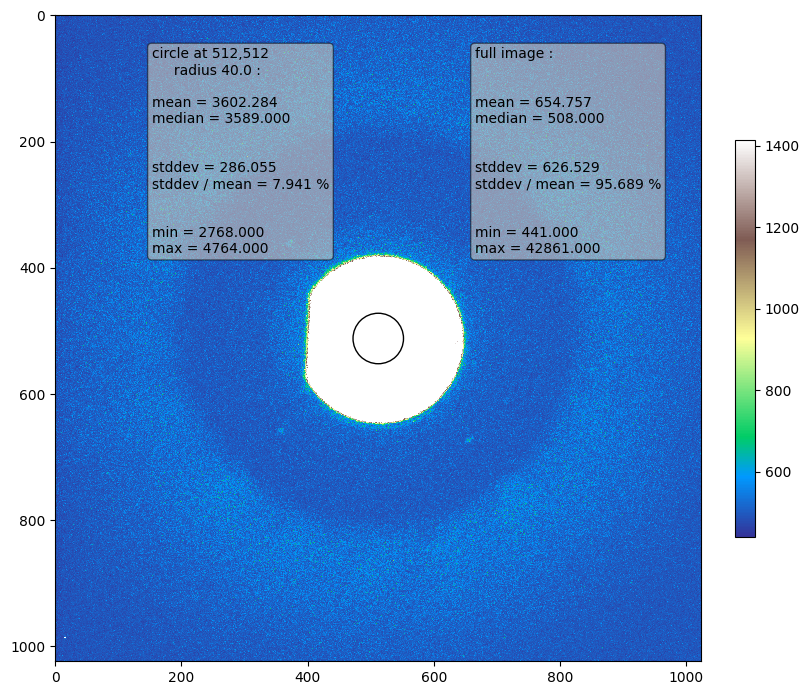

In [23]:
fig, ax = plot_data_simple(proton_raw_data.data[proton_det_id].raw.image, circle_px=proton_raw_data.data[proton_det_id].raw.init_circle)

In [35]:
proton_det_id

10

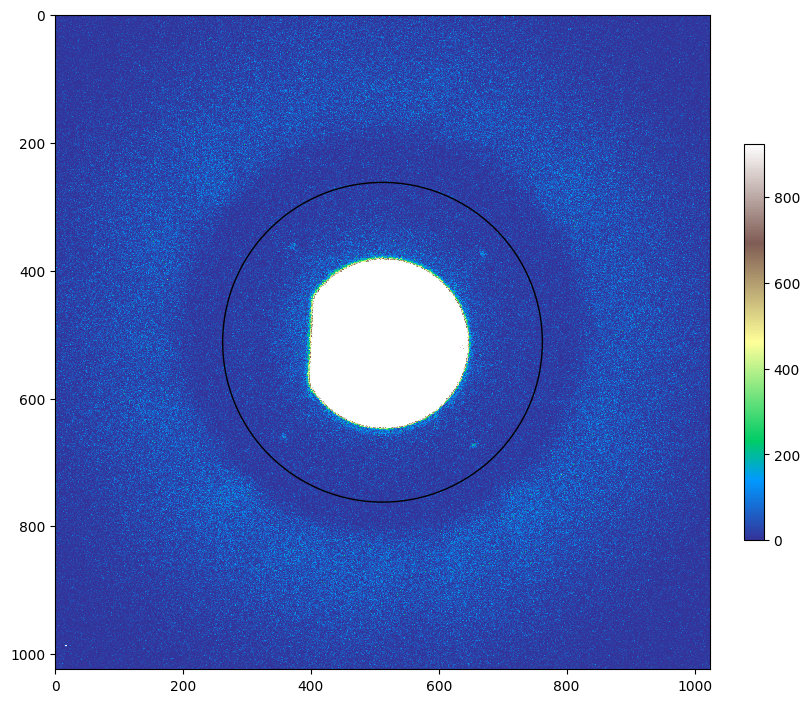

In [33]:
fig, ax = plot_data(proton_bg_sub_data.data[proton_det_id].raw.image, 
                    details=False,
                    describe=False,
                    circle_px=None)

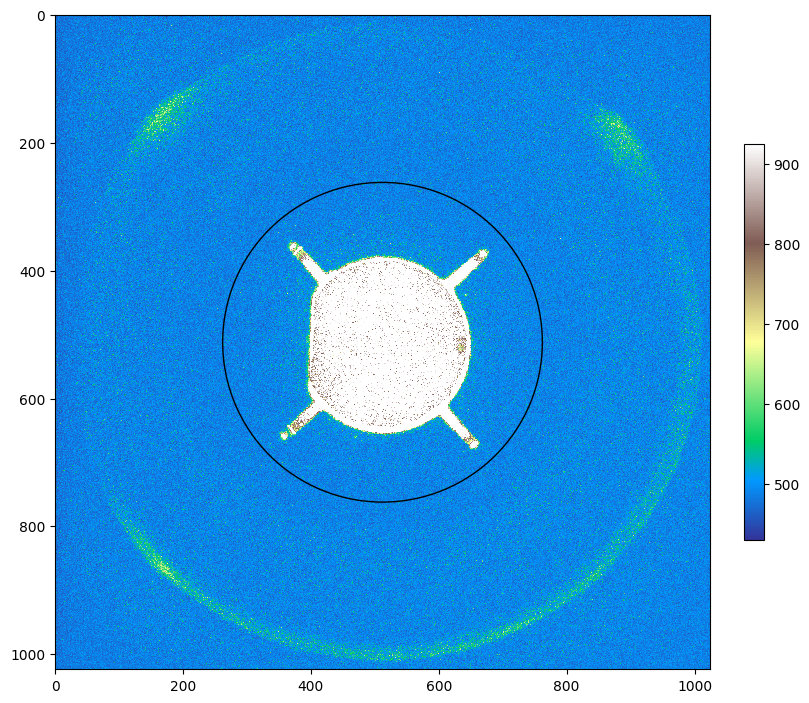

In [34]:
fig, ax = plot_data(proton_bg_sub_data.data[proton_det_id].lv.image, 
                    details=False,
                    describe=False,
                    circle_px=None)

In [25]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_bg_sub_data, co60_bg_sub_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.raw.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 11004.6
vmin: 0.0, vmax: 5064.6


# Detector discovery

In [36]:
det_data_dict = {}
for data in proton_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
proton_det_data = DetectorDataCollection(path=proton_raw_data.path, data=det_data_dict)

10 11 12 13 14 15 16 17 18 19 1 20 21 22 23 24 25 26 27 28 29 2 30 31 32 33 34 35 36 37 38 39 3 40 4 5 6 7 8 9 

In [37]:
det_data_dict = {}
for data in co60_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
co60_det_data = DetectorDataCollection(path=co60_raw_data.path, data=det_data_dict)

85 86 87 88 89 

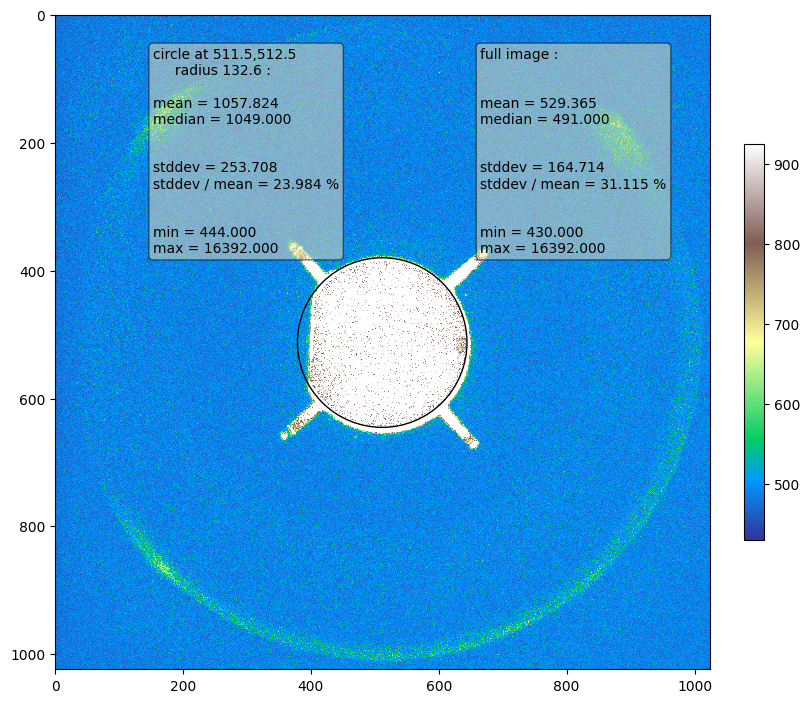

In [38]:
fig, ax = plot_data(proton_det_data.data[proton_det_id].lv.image, circle_px=proton_det_data.data[proton_det_id].circle)

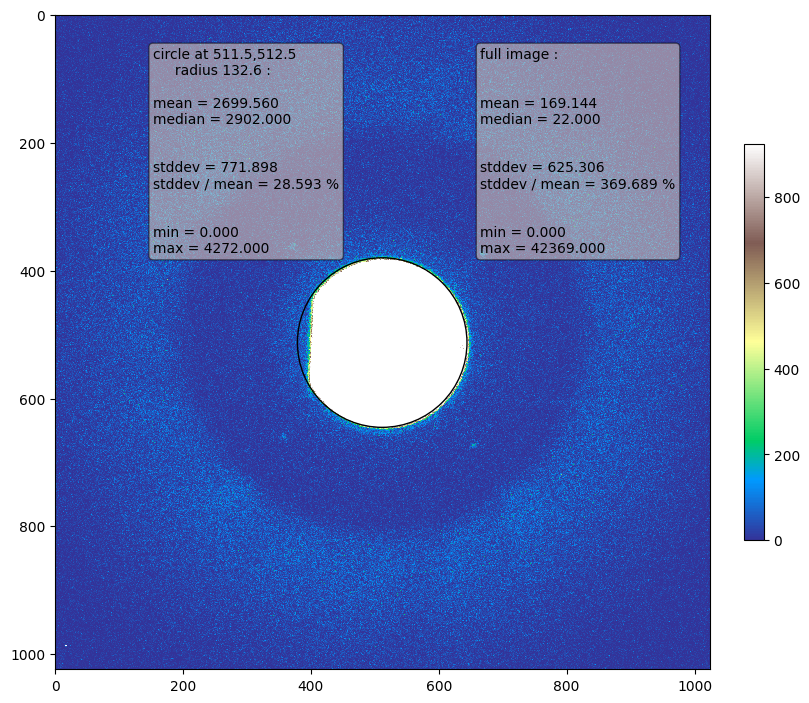

In [39]:
fig, ax = plot_data(proton_det_data.data[proton_det_id].raw.image, circle_px=proton_det_data.data[proton_det_id].circle)

In [40]:
mean_radius = np.mean([data.circle.r for data in proton_det_data.data.values()])
mean_radius_mm = 10.0
px_to_mm = mean_radius_mm / mean_radius
px_to_mm

0.07590708908476435

In [ ]:
# fig, ax = plt.subplots(2, 3, figsize=(12, 8))
# for data in proton_det_data.data.values():
#     ax[0, 0].plot(data.det_no, data.circle.x, '.')
#     ax[0, 1].plot(data.det_no, data.circle.y, '.')
#     ax[0, 2].plot(data.det_no, data.circle.r, '.')
# for data in co60_det_data.data.values():
#     ax[1, 0].plot(data.det_no, data.circle.x, '.')
#     ax[1, 1].plot(data.det_no, data.circle.y, '.')
#     ax[1, 2].plot(data.det_no, data.circle.r, '.')
# for a in ax.flat:
#     a.grid()
# for a in ax[0]:
#     a.set_xlabel('Proton det no')
# for a in ax[1]:
#     a.set_xlabel('Co60 det no')
# for a in ax[:, 0]:
#     a.set_ylabel('Det center x [px]')
# for a in ax[:, 1]:
#     a.set_ylabel('Det center y [px]')
# for a in ax[:, 2]:
#     a.set_ylabel('Det radius [px]')
# fig.tight_layout()

In [ ]:
# fig, ax = plt.subplots(2, 3, figsize=(12, 8))
# for data in proton_det_data.data.values():
#     ax[0, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
#     ax[0, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
#     ax[0, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
# for data in co60_det_data.data.values():
#     ax[1, 0].plot(data.det_no, data.circle.x * px_to_mm, '.')
#     ax[1, 1].plot(data.det_no, data.circle.y * px_to_mm, '.')
#     ax[1, 2].plot(data.det_no, data.circle.r * px_to_mm, '.')
# for a in ax.flat:
#     a.grid()
# for a in ax[0]:
#     a.set_xlabel('Proton det no')
# for a in ax[1]:
#     a.set_xlabel('Co60 det no')
# for a in ax[:, 0]:
#     a.set_ylabel('Det center x [mm]')
# for a in ax[:, 1]:
#     a.set_ylabel('Det center y [mm]')
# for a in ax[:, 2]:
#     a.set_ylabel('Det radius [mm]')
# fig.tight_layout()

## Save plots with detector

In [41]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'live_view'
    plot_path.mkdir(parents=True, exist_ok=True)

    # set vmin to the 5% centile of all images and vmax to 95% centile
    concatenated_flattened_lv_data = np.concatenate([data.lv.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_lv_data, q=5)
    vmax = np.nanpercentile(a=concatenated_flattened_lv_data, q=95)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_lv_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.lv.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        print(f"Saving {output_path}")
        plt.close(fig)

vmin: 472.0, vmax: 964.0
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det10
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det11
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det12
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det13
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det14
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det15
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det16
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det17
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/2025-03-27/PB/protons/live_view/det_lv_det18
Saving /home/grzanka/workspace/osl_mb_foils/data/interim/

In [42]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 11004.6
vmin: 0.0, vmax: 5064.6


## Detector cutting

In [44]:
min_radius_protons = min([data.circle.r for data in proton_det_data.data.values()])
min_radius_co60 = min([data.circle.r for data in co60_det_data.data.values()])
min_radius_all = np.floor(min(min_radius_protons, min_radius_co60)).astype(int)
min_radius_all
#min_radius_all = min_radius_protons

#print(f"min radius - protons: {min_radius_protons:.2f}, Co60: {min_radius_co60:.2f}, all: {min_radius_all}")
#print(f"min radius - protons: {min_radius_protons * px_to_mm:.2f} [mm], Co60: {min_radius_co60 * px_to_mm:.2f} [mm], all: {min_radius_all * px_to_mm:.2f} [mm]")

122

In [45]:
def cut_detector(det_data: DetectorData, min_radius: int, factor: float = 1.2) -> DetectorData:
    lower_x = np.ceil(det_data.circle.x - factor*min_radius).astype(int)
    upper_x = np.floor(det_data.circle.x + factor*min_radius).astype(int)
    lower_y = np.ceil(det_data.circle.y - factor*min_radius).astype(int)
    upper_y = np.floor(det_data.circle.y + factor*min_radius).astype(int)
    
    new_circle = Circle(x=det_data.circle.x - lower_x, y=det_data.circle.y - lower_y, r=det_data.circle.r)
    cut_raw_image = det_data.raw.image[lower_y:upper_y, lower_x:upper_x][:]
    cut_lv_image = det_data.lv.image[lower_y:upper_y, lower_x:upper_x][:]

    return DetectorData(raw=DetectorImage(image=cut_raw_image, path=det_data.raw.path), lv=DetectorImage(image=cut_lv_image, path=det_data.lv.path), det_no=det_data.det_no, circle=new_circle)

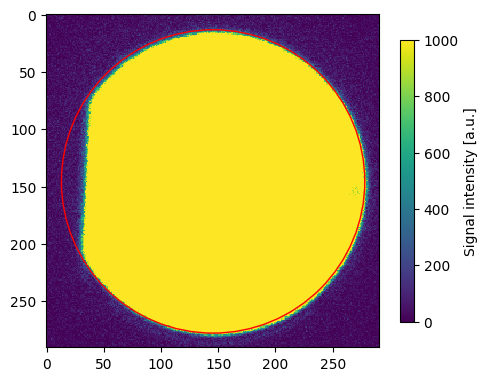

In [46]:
c1 = cut_detector(proton_det_data.data[proton_det_id], min_radius_all)

fig, ax = plt.subplots(figsize=(5, 5), facecolor='none')
im = ax.imshow(c1.raw.image, cmap='viridis', vmin=0, vmax=1000, interpolation='none')
ax.add_artist(plt.Circle((c1.circle.x, c1.circle.y), c1.circle.r, color='red', fill=False))
fig.colorbar(im, ax=ax, shrink=0.6, label='Signal intensity [a.u.]')
fig.tight_layout()

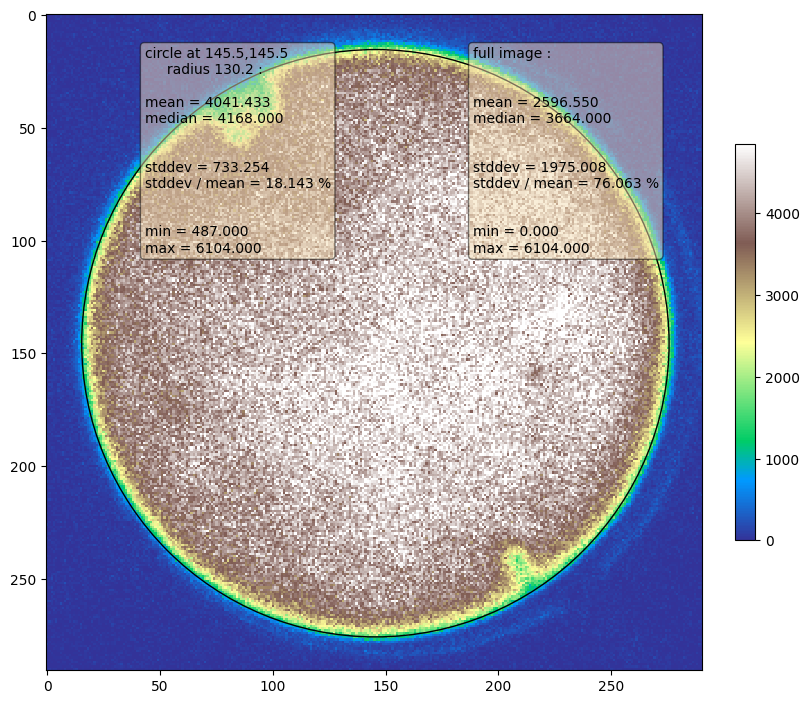

In [47]:
c1 = cut_detector(co60_det_data.data[co60_det_id], min_radius_all)
fig, ax = plot_data(c1.raw.image, circle_px=c1.circle)

In [48]:
det_data_dict = {}
for data in proton_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
proton_det_cut_data = DetectorDataCollection(path=proton_det_data.path, data=det_data_dict)

10 11 12 13 14 15 16 17 18 19 1 20 21 22 23 24 25 26 27 28 29 2 30 31 32 33 34 35 36 37 38 39 3 40 4 5 6 7 8 9 

In [49]:
det_data_dict = {}
for data in co60_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
co60_det_cut_data = DetectorDataCollection(path=co60_det_data.path, data=det_data_dict)

85 86 87 88 89 

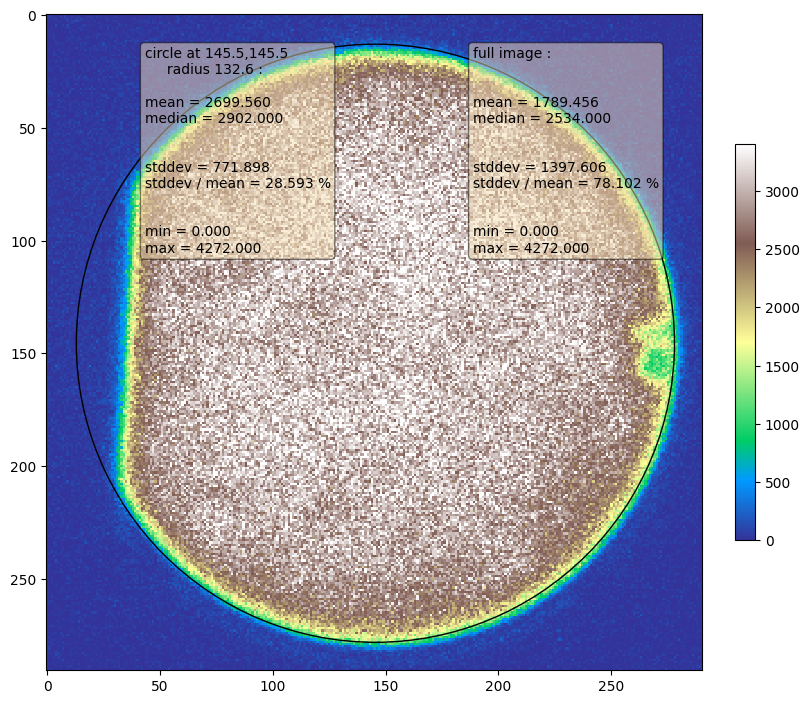

In [50]:
fig, ax = plot_data(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=proton_det_cut_data.data[proton_det_id].circle)

# Center of mass

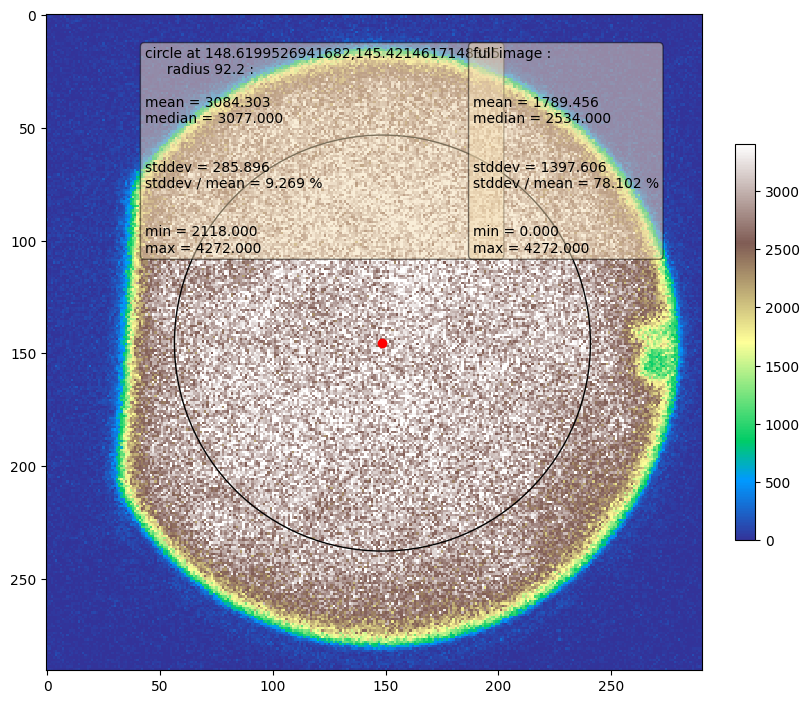

In [51]:
r_px = 7 / px_to_mm

cm1 = center_of_mass_det(proton_det_cut_data.data[proton_det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data_simple(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=cm1_circle, clip=True)
ax.plot(cm1[1], cm1[0], 'o', color='red')

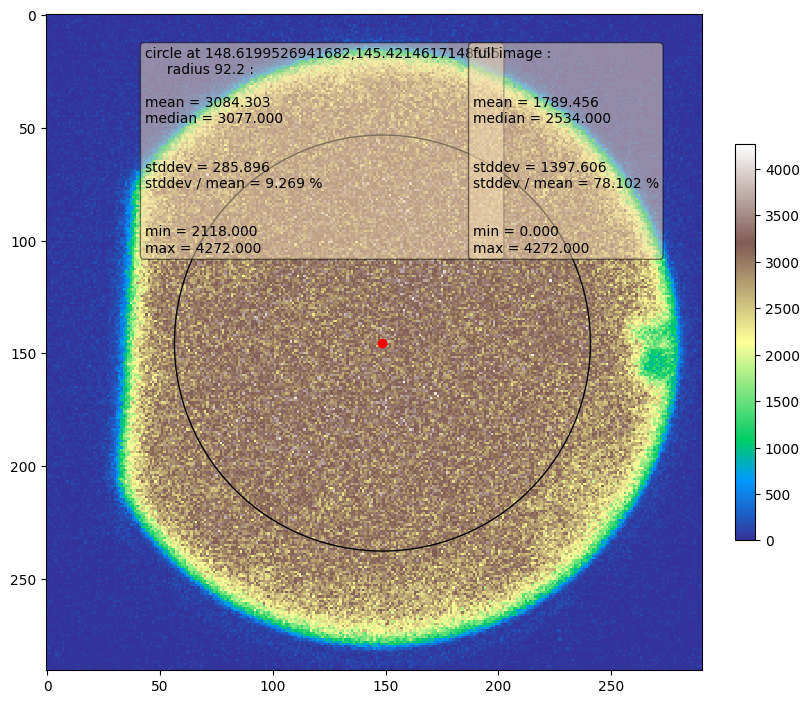

In [52]:
r_px = 7 / px_to_mm
cm1 = center_of_mass_det(proton_det_cut_data.data[proton_det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data_simple(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=cm1_circle, clip=False)
ax.plot(cm1[1], cm1[0], 'o', color='red')

In [53]:

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_cut_bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)

        # detectors we used without collimator
        r_mm = 10
        r_px = r_mm / px_to_mm

        cm = center_of_mass_det(data)
        cm_circle = Circle(x=cm[1], y=cm[0], r=r_px)
        ax.plot(cm[1], cm[0], 'o', color='red')
        ax.add_artist(
            plt.Circle(xy=(cm_circle.x, cm_circle.y),
                   radius=cm_circle.r,
                   color='red',
                   fill=False,
                   transform=ax.transData))

        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 11049.6
vmin: 6.0, vmax: 5063.0


In [54]:
# Save numpy data to disk for calculation of profiles

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):

# for plot_output_path, dataset in zip(
#     [proton_output_path, ],
#     [proton_det_cut_data, ]):
    npy_path = plot_output_path / 'bg_sub_data'
    npy_path.mkdir(parents=True, exist_ok=True)
    for det_no, data in dataset.data.items():
        output_path = npy_path / f'data_det{det_no:02d}'
        np.save(arr=data.raw.image, file=output_path)

# Mean signal inspection

In [55]:
min_radius_all
singal_radius = 0.7 * min_radius_all
singal_radius

85.39999999999999

In [56]:
df_data = defaultdict(list)
for data in proton_det_cut_data.data.values():
    cm = center_of_mass_det(data)
    cm_circle = Circle(x=cm[1], y=cm[0], r=singal_radius)
    mask = create_circular_mask(img=data.raw.image, circle_px=cm_circle)
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["proton"]
for data in co60_det_cut_data.data.values():
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["Co60"]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df['perc_error'] = df['std_signal'] / df['mean_signal'] * 100
df

,det_no,mean_signal,std_signal,radiation,perc_error
40,85,4431.379410,391.484327,Co60,8.834367
41,86,4495.380545,359.724361,Co60,8.002089
42,87,4239.729829,358.696265,Co60,8.460357
43,88,4421.830597,380.422715,Co60,8.603286
44,89,4266.833435,350.328672,Co60,8.210507
10,1,1810.714460,228.498542,proton,12.619248
21,2,2252.092406,252.532426,proton,11.213236
32,3,2139.513155,254.201077,proton,11.881258
34,4,2232.906221,249.501553,proton,11.173848
35,5,2284.310339,266.030746,proton,11.645998


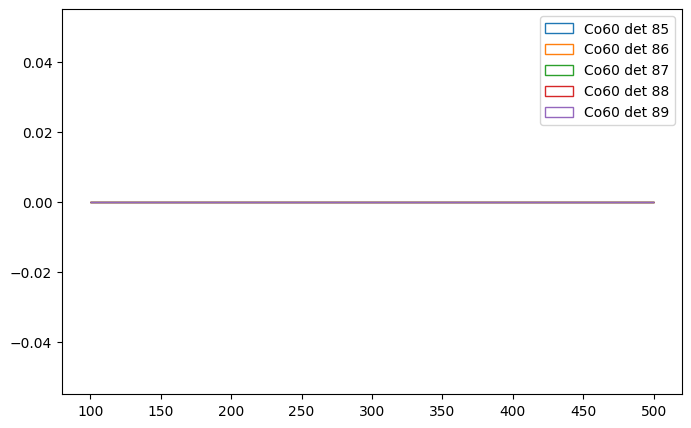

In [57]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
for data in co60_det_cut_data.data.values():
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    ax.hist(data.raw.image[mask].flatten(), bins=100, range=(100,500), label=f"Co60 det {data.det_no}", histtype='step')
ax.legend()

/home/grzanka/workspace/osl_mb_foils/.venv/lib/python3.12/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


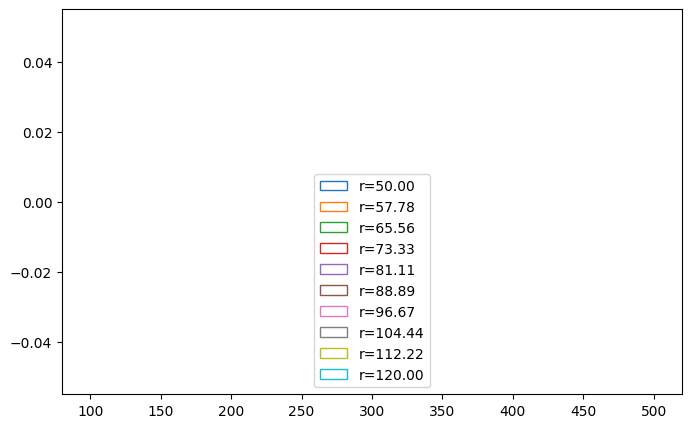

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
for signal_radius in np.linspace(50, 120, 10):
    data = co60_det_cut_data.data[co60_det_id]
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=signal_radius))
    ax.hist(data.raw.image[mask].flatten(), density=True, bins=400, range=(100,500), label=f"r={signal_radius:.2f}", histtype='step')
ax.legend()

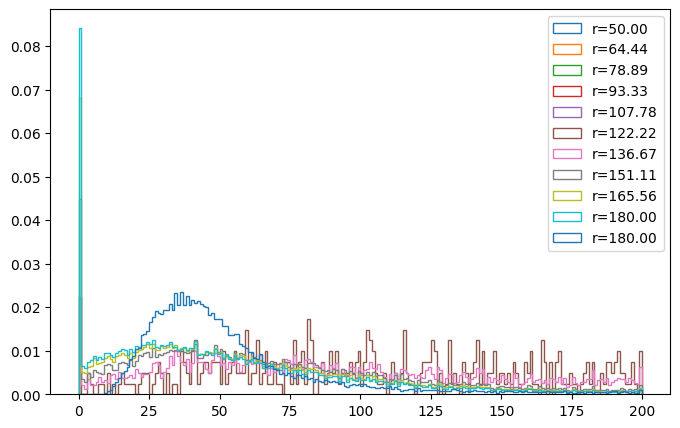

In [59]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
for signal_radius in np.linspace(50, 180, 10):
    data = proton_det_cut_data.data[proton_det_id]
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=signal_radius))
    ax.hist(data.raw.image[mask].flatten(), density=True, bins=200, range=(0,200), label=f"r={signal_radius:.2f}", histtype='step')

data_raw_image_with_gaussian_filter = ndi.gaussian_filter(data.raw.image, sigma=1)
ax.hist(data_raw_image_with_gaussian_filter[mask].flatten(), density=True, bins=200, range=(0,200), label=f"r={signal_radius:.2f}", histtype='step')
ax.legend()

<Axes: xlabel='det_no'>

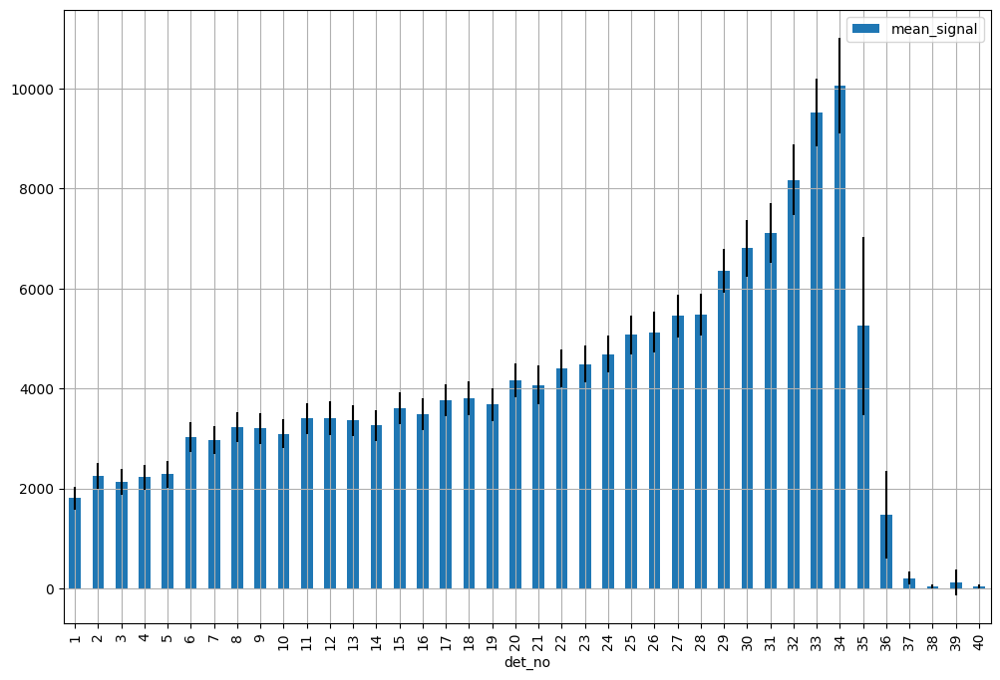

In [60]:
df.query("radiation == 'proton'").plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

<Axes: xlabel='det_no'>

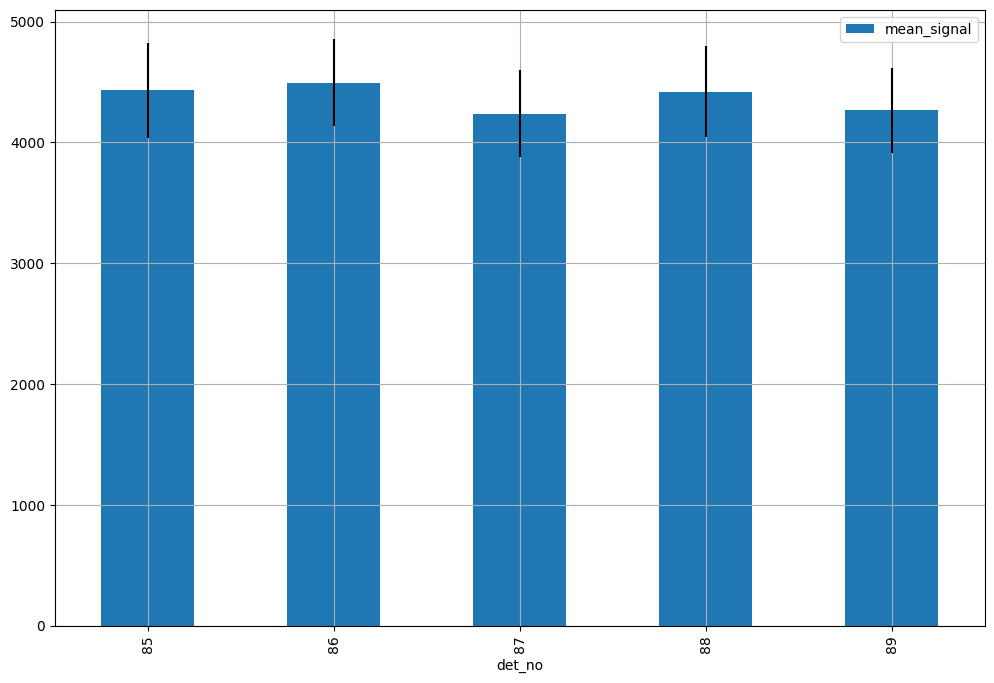

In [61]:
df[df.radiation == 'Co60'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

In [65]:
dose_per_unit_signal_Co60_Gy = df.query("radiation == 'Co60'").mean_signal.mean() / 60
dose_per_unit_signal_Co60_Gy

72.85051271975782

In [66]:
# df = df.join(dose_per_unit_signal_Co60_Gy, on='det_no', rsuffix='_per_Gy')
# df

In [67]:
df['dose_Co60_Gy'] = df.mean_signal / dose_per_unit_signal_Co60_Gy
df

,det_no,mean_signal,std_signal,radiation,perc_error,dose_Co60_Gy
40,85,4431.379410,391.484327,Co60,8.834367,60.828390
41,86,4495.380545,359.724361,Co60,8.002089,61.706917
42,87,4239.729829,358.696265,Co60,8.460357,58.197666
43,88,4421.830597,380.422715,Co60,8.603286,60.697316
44,89,4266.833435,350.328672,Co60,8.210507,58.569710
10,1,1810.714460,228.498542,proton,12.619248,24.855205
21,2,2252.092406,252.532426,proton,11.213236,30.913885
32,3,2139.513155,254.201077,proton,11.881258,29.368539
34,4,2232.906221,249.501553,proton,11.173848,30.650522
35,5,2284.310339,266.030746,proton,11.645998,31.356133


<Axes: xlabel='det_no'>

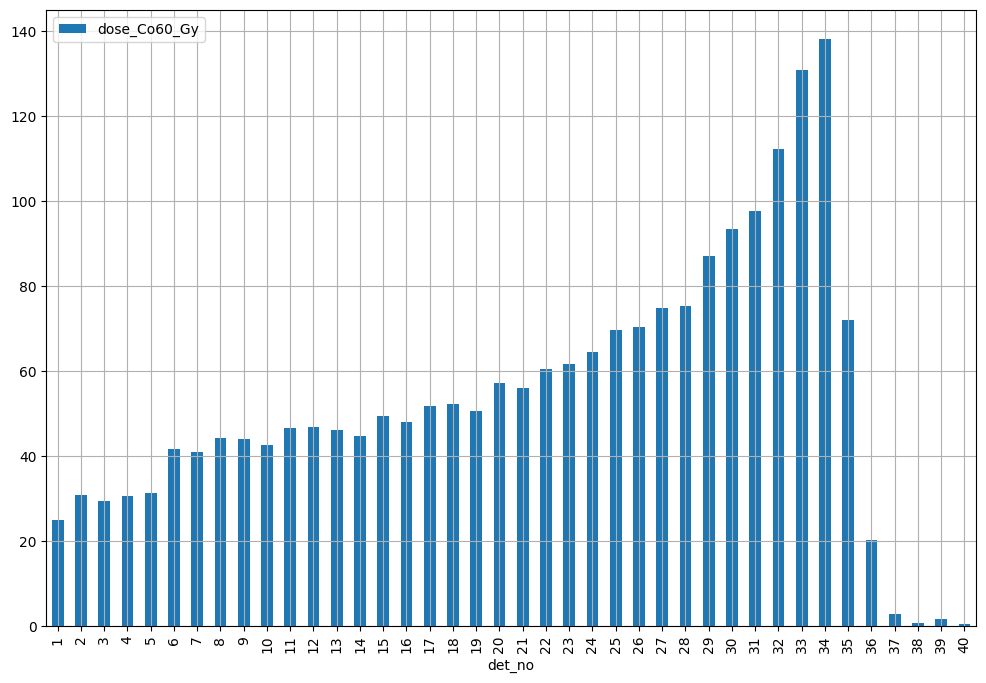

In [68]:
df.query("radiation == 'proton'").plot(x='det_no', y='dose_Co60_Gy', kind='bar', figsize=(12, 8), grid=True)

In [69]:
df.query('radiation == "proton" and det_no == 1').dose_Co60_Gy / 34.85

10    0.713205
Name: dose_Co60_Gy, dtype: float64

In [70]:
df.to_hdf(proton_output_path / 'mean_values.h5', key='data', mode='w')

# Finding circles

In [ ]:
det_data_dict = {}
for data in proton_det_cut_data.data.values():
    det_data_dict[data.det_no] = data
    print(f"{data.det_no} ", end='')
proton_det_sel_data = DetectorDataCollection(path=proton_det_cut_data.path, data=det_data_dict)

In [ ]:
det_data_dict = {}
for data in co60_det_cut_data.data.values():
    det_data_dict[data.det_no] = data
    print(f"{data.det_no} ", end='')
co60_det_sel_data = DetectorDataCollection(path=co60_det_cut_data.path, data=det_data_dict)

In [ ]:
num_circles = 10000
small_radius = 10
shift_x, shift_y = [], []
min_radius_all = 100

center_max_radius_px = 0.8*min_radius_all-small_radius
center_max_radius_mm = center_max_radius_px * px_to_mm

for _ in range(num_circles):
    angle = random.uniform(0, 2*np.pi)
    distance = random.uniform(0, center_max_radius_px)
    shift_x.append(distance * math.cos(angle))
    shift_y.append(distance * math.sin(angle))

center_max_radius_mm

In [ ]:
cm1 = center_of_mass_det(proton_det_cut_data.data[proton_det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data_simple(proton_det_cut_data.data[proton_det_id].raw.image, circle_px=cm1_circle, clip=False)
for circle_no in range(num_circles)[:1000]:
    circle = Circle(x=cm1_circle.x + shift_x[circle_no], y=cm1_circle.y + shift_y[circle_no], r=small_radius)
    ax.plot(circle.x, circle.y, 'o', color='red', alpha=0.1)

In [ ]:
df_data = defaultdict(list)
for data in proton_det_sel_data.data.values():
    cm1 = center_of_mass_det(data)
    cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
    for circle_no in range(num_circles):
        circle = Circle(x=cm1_circle.x + shift_x[circle_no], y=cm1_circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["proton"]
        df_data["circle_no"] += [circle_no]
for data in co60_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["Co60"]
        df_data["circle_no"] += [circle_no]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

In [ ]:
sns.set_theme(style="whitegrid")
sns.histplot(x="mean_signal", hue="det_no", data=df.query('radiation == "Co60"'), element='step')

In [ ]:
df2 = pd.DataFrame()
df2["mean"] = df.groupby(["radiation", "det_no"])["mean_signal"].mean()
df2["std"] = df.groupby(["radiation", "det_no"])["mean_signal"].std()
df2

In [ ]:
sns.relplot(data=df2.reset_index(), x='det_no', y='mean', hue='radiation', style='radiation', kind='line')

In [ ]:
sns.relplot(data=df2.reset_index(), x='det_no', y='std', hue='radiation', style='radiation', kind='line')

In [ ]:
# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()
df2_reset = df2_reset[df2_reset.det_no <= 28]

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points
sns.lineplot(data=df2_reset, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars
for radiation_type in df2_reset['radiation'].unique():
    subset = df2_reset[df2_reset['radiation'] == radiation_type]
    plt.errorbar(subset['det_no'], subset['mean'], yerr=subset['std'], fmt='none', capsize=5, label=f'{radiation_type} Error')

plt.title('Mean Values and Standard Deviations by Detector Number')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

In [ ]:
df.to_hdf(base_output_path / 'data_circles.h5', key='df', mode='w')